In [15]:
import os 
import re 
from scipy import ndimage, misc 
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array


from skimage.transform import resize, rescale
import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout, Activation
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add, BatchNormalization,Concatenate 
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf

print(tf.__version__)

2.6.0


# Create  LOW Resolution image  of any given data 

In [16]:
def downsample_image(image,scale):
    x=tf.image.resize(image / 255,(image.shape[0]//scale, image.shape[1]//scale))
    x=tf.image.resize(x,(image.shape[0], image.shape[1]), method = tf.image.ResizeMethod.BICUBIC)
    return x

# Data Visualisation and Splitting 


 94%|█████████▎| 800/855 [00:05<00:00, 134.79it/s]


Shape of training images: (640, 256, 256, 3)
Shape of test images: (30, 256, 256, 3)
Shape of validation images: (130, 256, 256, 3)


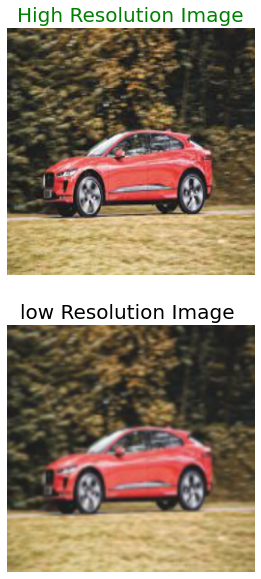

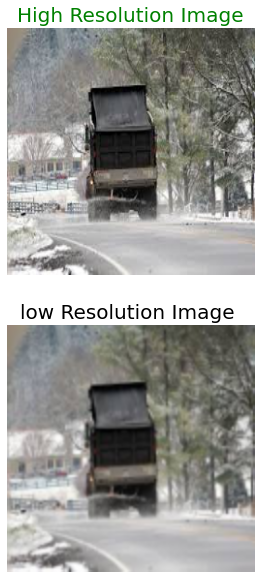

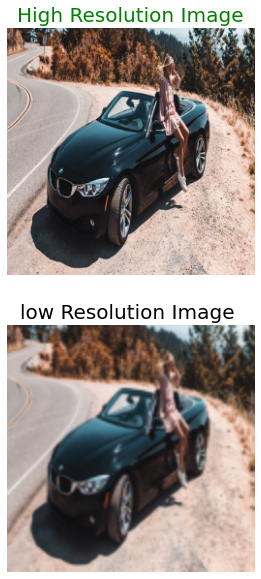

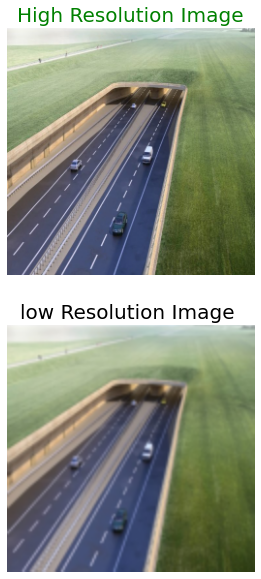

In [17]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE =256
high_img = []
#path = '../input/div2k-dataset/DIV2K_train_HR/DIV2K_train_HR'
path = '../input/image-super-resolution/dataset/Raw Data/high_res'
#path = '../input/urban100/Urban 100/X2 Urban100/X2/HIGH/X2 Urban'
#path= '../input/2k-resolution-dataset/2K data'
#path='../input/dataset-image-super-resolution/finished/train/dataraw/hires/'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '800.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img,(SIZE, SIZE))
        img = img.astype('float32')/ 255.0
        high_img.append(img_to_array(img))


low_img = []
#path = '../input/div2k-bicubic-x4/DIV2K_train_LR_bicubic/X4'
path = '../input/image-super-resolution/dataset/Raw Data/low_res'
#path = '../input/urban100/Urban 100/X2 Urban100/X2/LOW X2 Urban'
#path= '../input/2k-resolution-dataset/2K data'
#path='../input/dataset-image-super-resolution/finished/train/dataraw/hires/'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '800.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img,(SIZE, SIZE))
        #img = img.astype('float32') / 255.0
        img = downsample_image(img,1)
        low_img.append(img_to_array(img))
        
        
for i in range(4):
    a = np.random.randint(0,800)
    plt.figure(figsize=(10,10))
    plt.subplot(2,1,1)
    plt.title('High Resolution Image', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(2,1,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')
train_high_image = high_img[:640]
train_low_image = low_img[:640]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[640:770]
validation_low_image = low_img[640:770]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[770:]
test_low_image = low_img[770:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

# upsample image using Sub pixel Suffling 

In [18]:
def Upsample_block(x,ch=128, k_s=3, st=1 ,upscale_factor=2):
    x = tf.keras.layers.Conv2D(ch,k_s,strides=(st,st), padding='same')(x)                # convolution
    x = tf.keras.layers.Conv2D(ch,k_s,strides=(st,st), padding='same')(x)
    x = tf.nn.depth_to_space(x,upscale_factor)                                           # Subpixel pixelshuffler
    x = tf.keras.layers.LeakyReLU()(x)
    return x

# Residual Block 

In [19]:
def Residual_block(x,filter_size=3, size=64):
    conv = tf.keras.layers.Conv2D(size,(filter_size, filter_size), padding='same') (x)      #(sizexsizex64)
    conv = tf.keras.layers.BatchNormalization(axis=3)(conv)
    conv = tf.keras.layers.Activation('relu' )(conv)                                   #(sizexsizex64)
    conv = tf.keras.layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)   #(sizexsizex64)
    conv = tf.keras.layers.BatchNormalization(axis=3)(conv)
    #res_path = tf.keras.layers.add([x,conv])  
    res_path=Concatenate()([x,conv])
    res_path = tf.keras.layers.Activation('relu')(res_path)
    return res_path

# Auto Encoder 

In [20]:
def AutoEncoder(x,filter_size=3,size=64):
    l1=Conv2D (size,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(x)
    l1= tf.keras.layers.BatchNormalization(axis=3)(l1)
    l2=Conv2D (size,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l1)
    l2= tf.keras.layers.BatchNormalization(axis=3)(l2)
    l3=MaxPooling2D(padding='same')(l2)
    l4=Conv2D (size*2,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l3)
    l4= tf.keras.layers.BatchNormalization(axis=3)(l4)
    l5=Conv2D (size*2,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l4)
    l5= tf.keras.layers.BatchNormalization(axis=3)(l5)
    l6=MaxPooling2D(padding='same')(l5)
    l7=Conv2D (size*4,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l6)
    l7= tf.keras.layers.BatchNormalization(axis=3)(l7)
    
    
    
    l8=UpSampling2D()(l7)
    l9=Conv2D(size*2,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l8)
    l9= tf.keras.layers.BatchNormalization(axis=3)(l9)
    l10=Conv2D(size*2,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l9)
    l10= tf.keras.layers.BatchNormalization(axis=3)(l10)
    l11=Concatenate()([l10,l5])
    l12=UpSampling2D()(l11)
    l13=Conv2D (size,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l12)
    l13= tf.keras.layers.BatchNormalization(axis=3)(l13)
    l14=Conv2D (size,(filter_size,filter_size) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l13)
    l14= tf.keras.layers.BatchNormalization(axis=3)(l14)
    l15=Concatenate()([l14,l2])
    #decoder=Conv2D (3,(filter_size*3,filter_size*3) , padding='same' ,activation='relu',activity_regularizer=regularizers.l1(10e-10))(l15)
    return l15
    #return Model(input_img,decoder)

# MODEL


In [21]:
input_img=Input(shape=(SIZE,SIZE,3))
input_conv=tf.keras.layers.Conv2D(64,9,padding='same')(input_img)           #(256x256x64 )
input_conv=tf.keras.layers.LeakyReLU()(input_conv)



def model():
    sr=input_conv                                               
    for i in range(5):
        res=AutoEncoder(sr)
        res=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu',activity_regularizer=regularizers.l1(10e-10))(res)
        res= tf.keras.layers.BatchNormalization(axis=3)(res)
        res=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',activity_regularizer=regularizers.l1(10e-10))(res)
        sr= Concatenate()([res,sr])
        sr=Residual_block(sr)
        sr=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu',activity_regularizer=regularizers.l1(10e-10))(sr)
        sr=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',activity_regularizer=regularizers.l1(10e-10))(sr)
        sr=Concatenate()([input_conv,sr])
        sr=Upsample_block(sr)
        sr=MaxPooling2D(padding='same')(sr)
        sr=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',activity_regularizer=regularizers.l1(10e-10))(sr)
        sr= tf.keras.layers.Attention()([sr,input_conv])
        #sr=tf.keras.layers.GlobalAveragePooling2D() (sr)
        #sr=tf.keras.layers.Dense(32, activation='relu')(sr)
        #sr=tf.keras.layers.Dense(64, activation='relu') (sr)
        sr=Activation('LeakyReLU')(sr)
        sr=add([input_conv,sr])
    sr=Upsample_block(sr)
    sr=MaxPooling2D(padding='same')(sr)
    #sr=AutoEncoder(sr)

    
    
    
    output_img=tf.keras.layers.Conv2D(3,9,activation='LeakyReLU',padding='same')(sr)
    return tf.keras.models.Model(input_img,output_img)
model = model()
model.summary()
#plot_model(model, to_file ='super_res(x).png',show_shapes=True)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_40 (Conv2D)              (None, 256, 256, 64) 15616       input_2[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_7 (LeakyReLU)       (None, 256, 256, 64) 0           conv2d_40[0][0]                  
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 256, 256, 64) 36928       leaky_re_lu_7[0][0]              
____________________________________________________________________________________________

# Train Model 

In [22]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate =0.001), loss ='mean_absolute_error',metrics = ['acc'])
model.fit(train_low_image,train_high_image, epochs =10, batch_size =1,validation_data = (validation_low_image,validation_high_image))

Epoch 1/10
640/640 [==============================] - 263s 394ms/step - loss: 0.1491 - acc: 0.4673 - val_loss: 2.3527 - val_acc: 0.3680
Epoch 2/10
640/640 [==============================] - 250s 391ms/step - loss: 0.0843 - acc: 0.5292 - val_loss: 0.0586 - val_acc: 0.6174
Epoch 3/10
640/640 [==============================] - 250s 390ms/step - loss: 0.0650 - acc: 0.5779 - val_loss: 0.2422 - val_acc: 0.6994
Epoch 4/10
640/640 [==============================] - 250s 390ms/step - loss: 1.3175 - acc: 0.4559 - val_loss: 0.0988 - val_acc: 0.6581
Epoch 5/10
640/640 [==============================] - 250s 390ms/step - loss: 0.0659 - acc: 0.6245 - val_loss: 0.1101 - val_acc: 0.5206
Epoch 6/10
640/640 [==============================] - 250s 390ms/step - loss: 0.0556 - acc: 0.6458 - val_loss: 0.1692 - val_acc: 0.6324
Epoch 7/10
640/640 [==============================] - 250s 391ms/step - loss: 0.0602 - acc: 0.6255 - val_loss: 0.0986 - val_acc: 0.5984
Epoch 8/10
640/640 [============================

# Model Prediction 

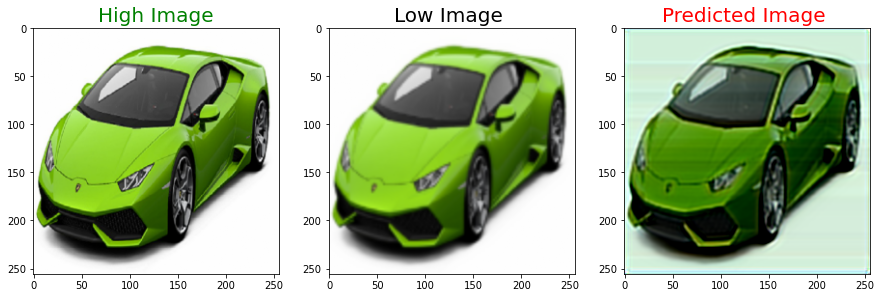

PSNR tf.Tensor(16.212303, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7227065, shape=(), dtype=float32)


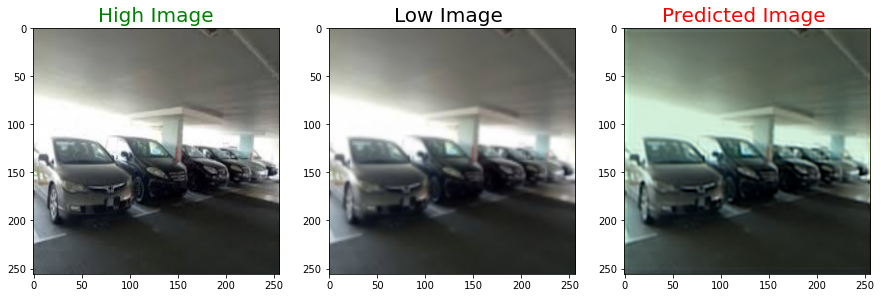

PSNR tf.Tensor(22.8487, shape=(), dtype=float32) dB SSIM tf.Tensor(0.93664575, shape=(), dtype=float32)


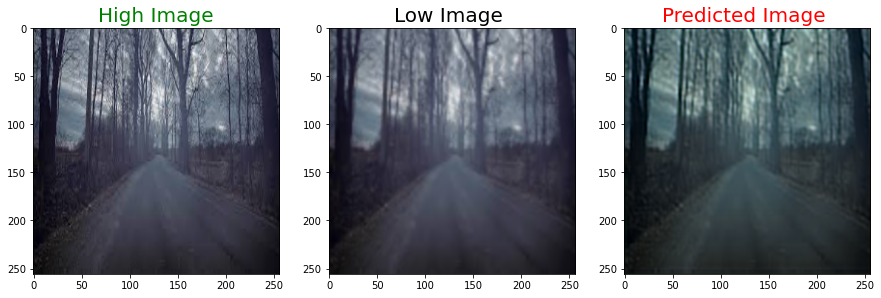

PSNR tf.Tensor(23.364853, shape=(), dtype=float32) dB SSIM tf.Tensor(0.82189846, shape=(), dtype=float32)


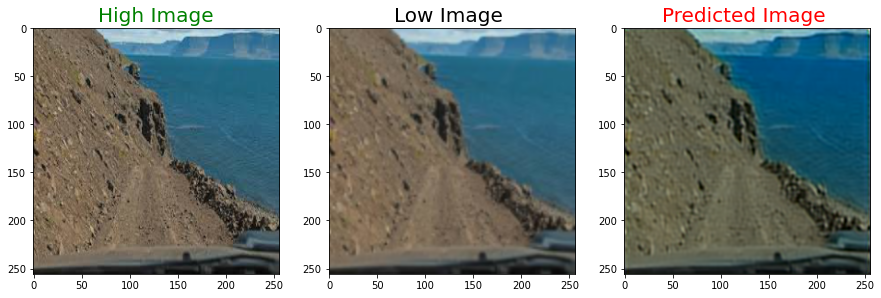

PSNR tf.Tensor(21.533787, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7085429, shape=(), dtype=float32)


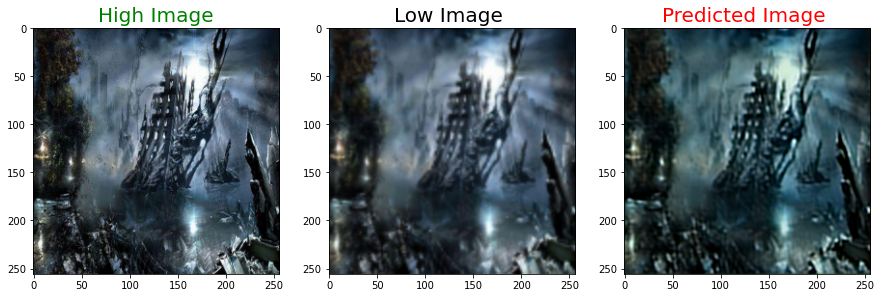

PSNR tf.Tensor(21.848854, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7666386, shape=(), dtype=float32)


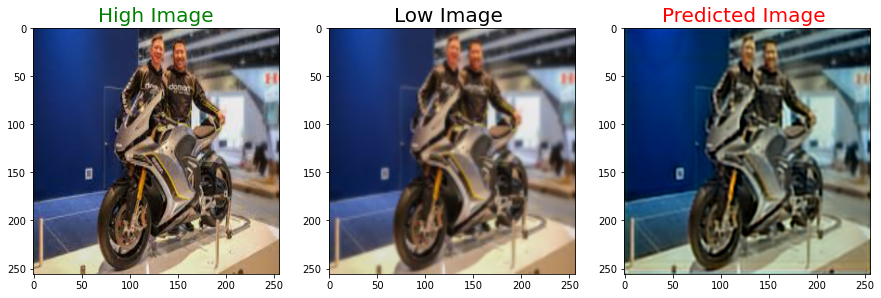

PSNR tf.Tensor(21.346247, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7842086, shape=(), dtype=float32)


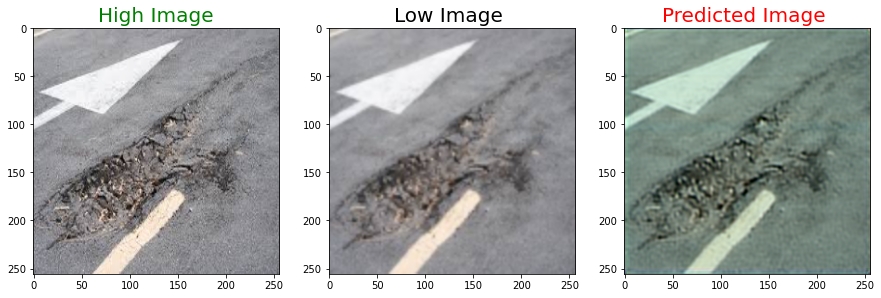

PSNR tf.Tensor(20.209335, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7040188, shape=(), dtype=float32)


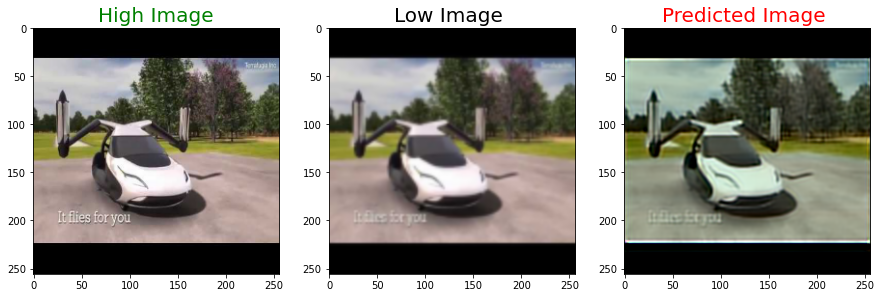

PSNR tf.Tensor(22.14597, shape=(), dtype=float32) dB SSIM tf.Tensor(0.85193783, shape=(), dtype=float32)


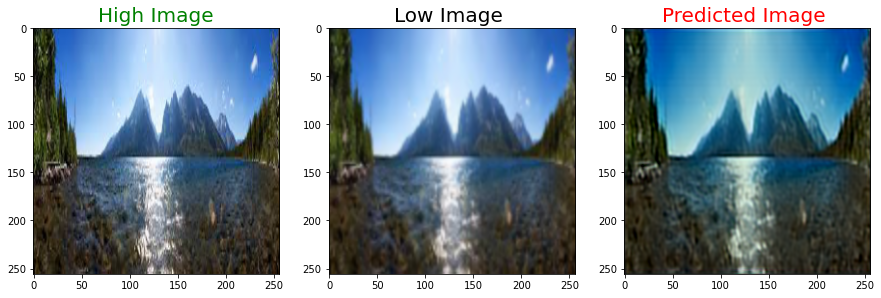

PSNR tf.Tensor(19.365644, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7864752, shape=(), dtype=float32)


In [23]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2)
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean((y_true - y_pred) ** 2)


def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(1,10):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(test_high_image[i],predicted,max_val=1))

In [24]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = '../input/urban100/Urban 100/X2 Urban100/X2/HIGH X2 Urban'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '100.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '../input/urban100/Urban 100/X2 Urban100/X2/LOW X2 Urban'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '100.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        #img = img.astype('float32') / 255.0
        img = downsample_image(img,2)
        low_img.append(img_to_array(img))
        
high_image = high_img[:50]
low_image = low_img[:50]
high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

#validation_high_image = high_img[650:750]
#validation_low_image = low_img[650:750]
#validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE*2,SIZE*2,3))
#validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


t_high_image = high_img[50:]
t_low_image = low_img[50:]
t_high_image= np.reshape(t_high_image,(len(t_high_image),SIZE,SIZE,3))
t_low_image = np.reshape(t_low_image,(len(t_low_image),SIZE,SIZE,3))


100%|██████████| 100/100 [00:00<00:00, 143.49it/s]


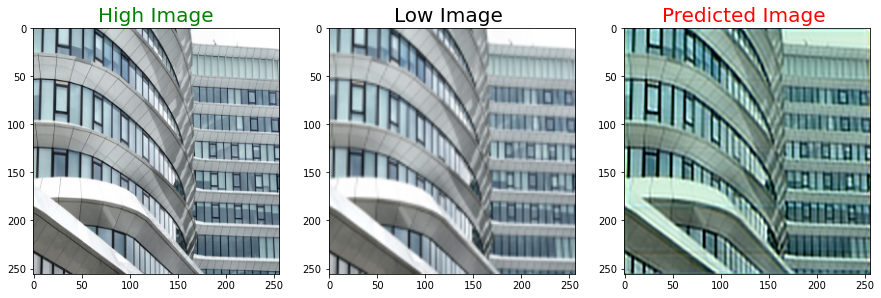

PSNR tf.Tensor(17.712872, shape=(), dtype=float32) dB SSIM tf.Tensor(0.74027616, shape=(), dtype=float32)


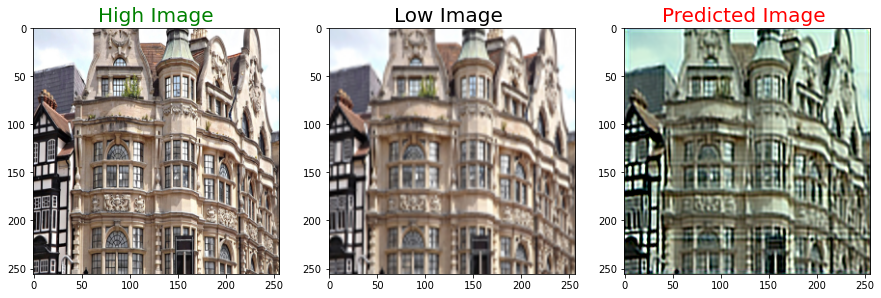

PSNR tf.Tensor(17.488007, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7362984, shape=(), dtype=float32)


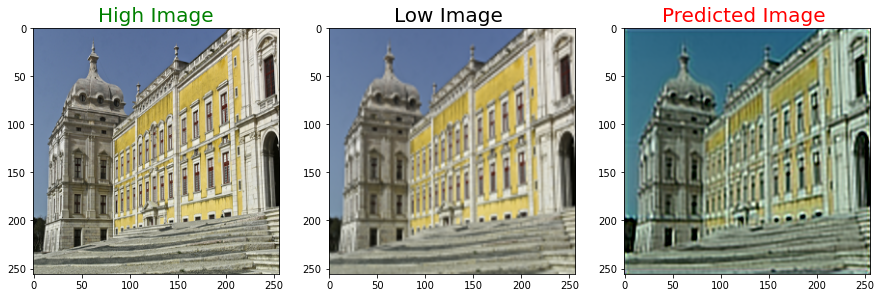

PSNR tf.Tensor(17.83255, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6981906, shape=(), dtype=float32)


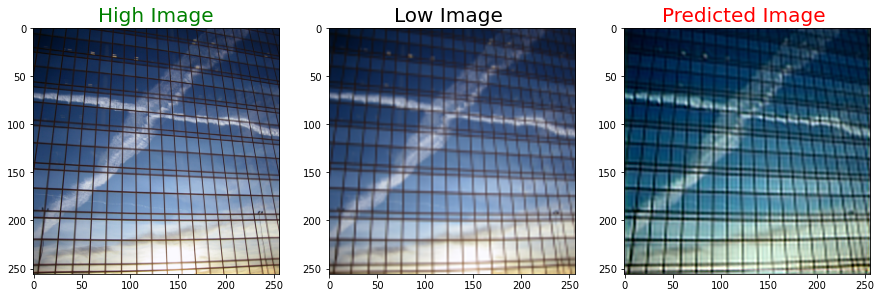

PSNR tf.Tensor(18.09924, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6253149, shape=(), dtype=float32)


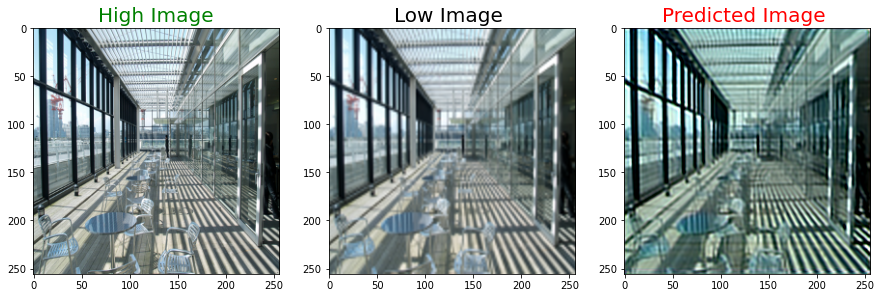

PSNR tf.Tensor(18.547573, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7186491, shape=(), dtype=float32)


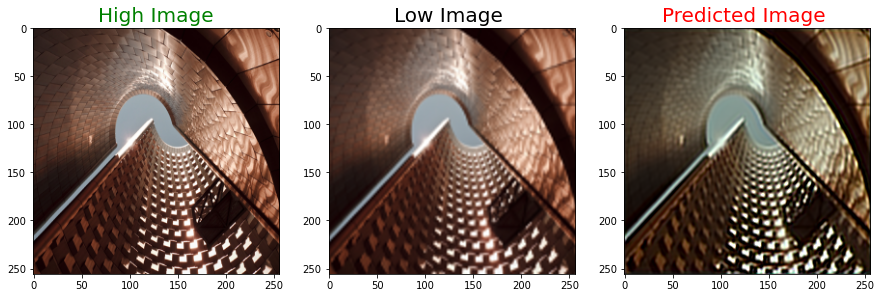

PSNR tf.Tensor(22.023535, shape=(), dtype=float32) dB SSIM tf.Tensor(0.80089855, shape=(), dtype=float32)


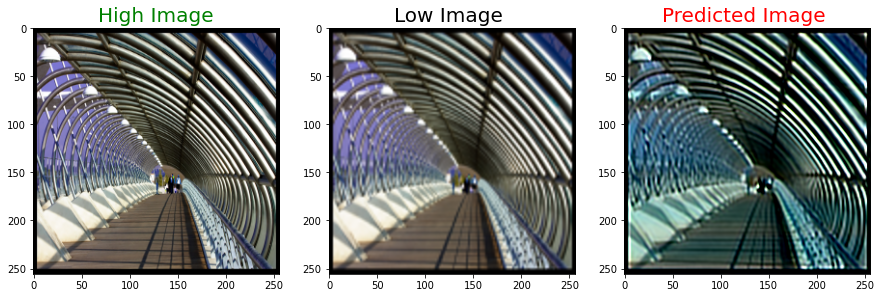

PSNR tf.Tensor(16.091942, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6682971, shape=(), dtype=float32)


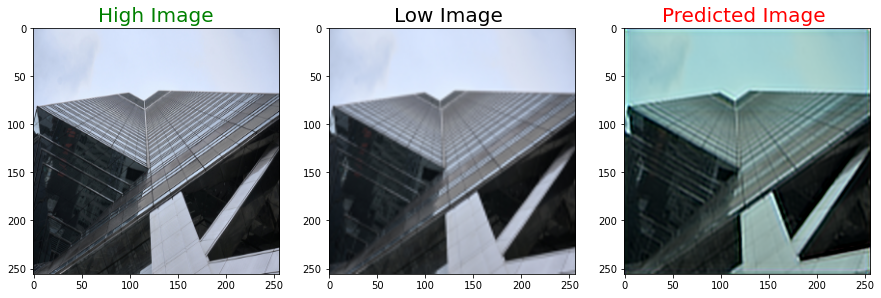

PSNR tf.Tensor(19.234238, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7266391, shape=(), dtype=float32)


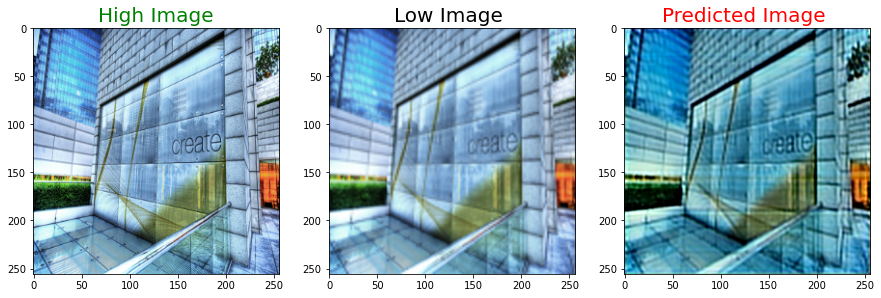

PSNR tf.Tensor(15.926367, shape=(), dtype=float32) dB SSIM tf.Tensor(0.65660614, shape=(), dtype=float32)


In [25]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(1,10):
    
    predicted = np.clip(model.predict(t_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(t_high_image[i],t_low_image[i],predicted)
    print('PSNR',PSNR(t_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(t_high_image[i],predicted,max_val=1))

# Image Super Resolution dataset


 94%|█████████▎| 800/855 [00:06<00:00, 127.90it/s]


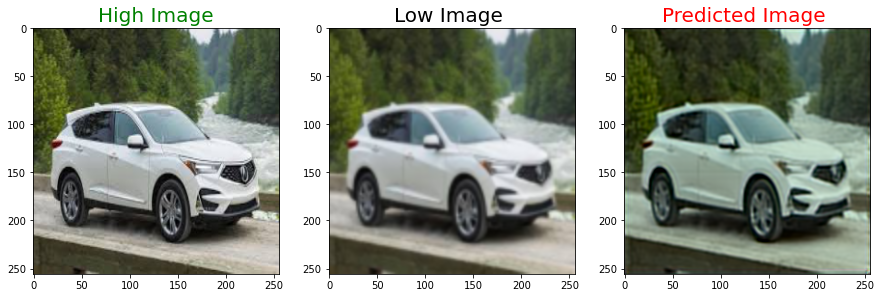

PSNR tf.Tensor(21.209332, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8396315, shape=(), dtype=float32)


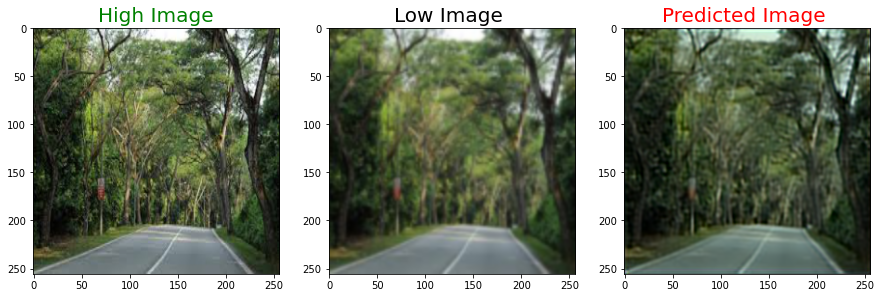

PSNR tf.Tensor(21.626503, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7225559, shape=(), dtype=float32)


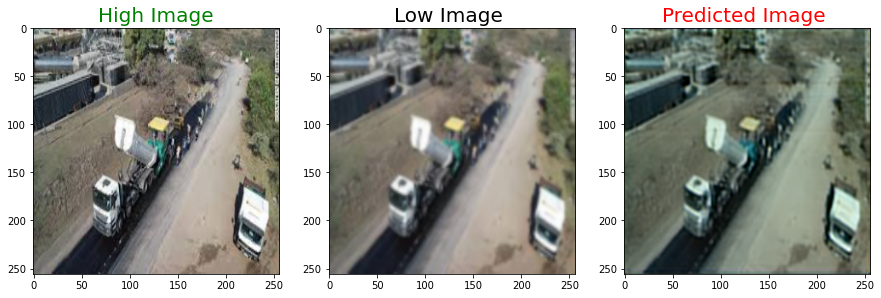

PSNR tf.Tensor(21.535183, shape=(), dtype=float32) dB SSIM tf.Tensor(0.80577976, shape=(), dtype=float32)


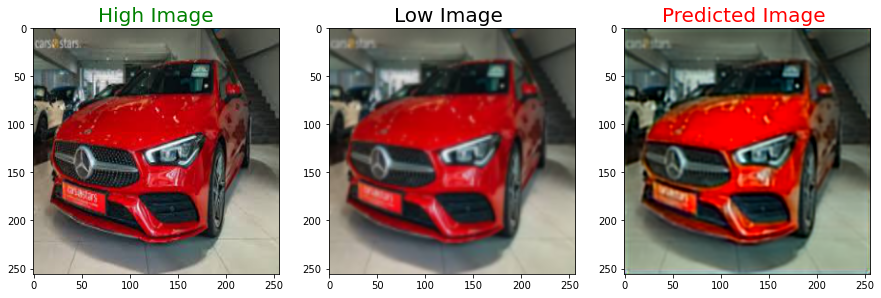

PSNR tf.Tensor(22.299824, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7691632, shape=(), dtype=float32)


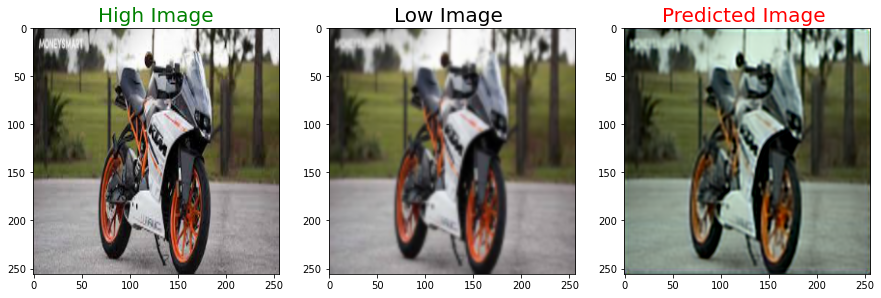

PSNR tf.Tensor(20.978945, shape=(), dtype=float32) dB SSIM tf.Tensor(0.82785535, shape=(), dtype=float32)


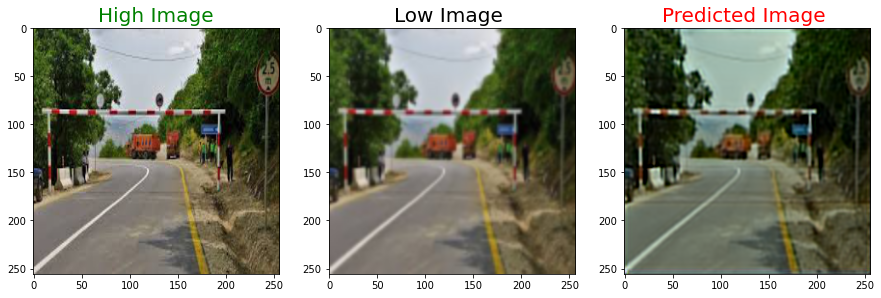

PSNR tf.Tensor(21.696093, shape=(), dtype=float32) dB SSIM tf.Tensor(0.76469755, shape=(), dtype=float32)


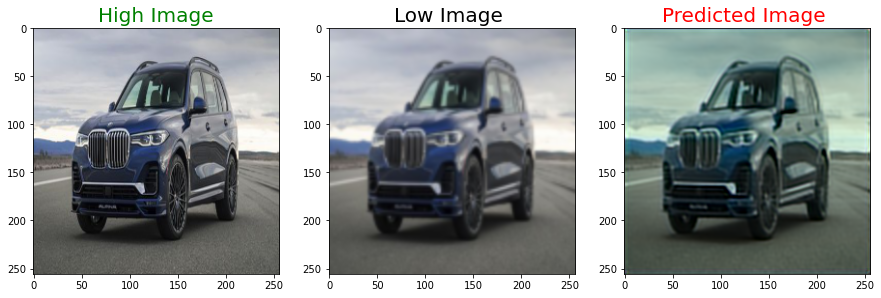

PSNR tf.Tensor(21.088923, shape=(), dtype=float32) dB SSIM tf.Tensor(0.81956834, shape=(), dtype=float32)


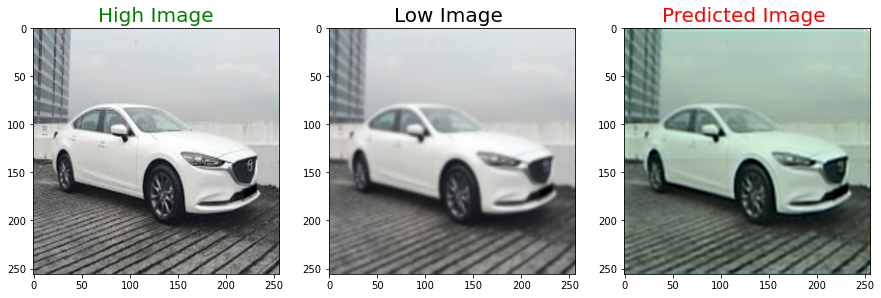

PSNR tf.Tensor(19.683804, shape=(), dtype=float32) dB SSIM tf.Tensor(0.8375705, shape=(), dtype=float32)


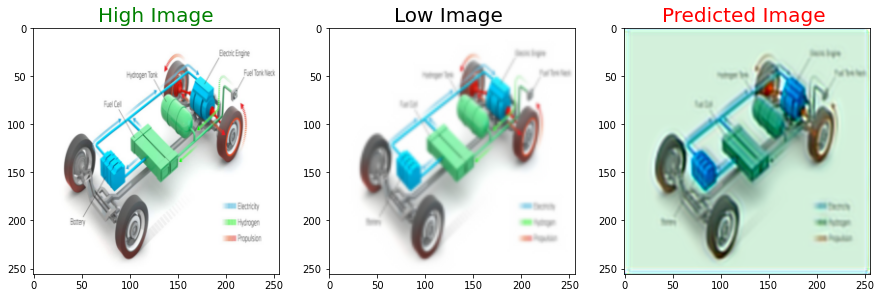

PSNR tf.Tensor(17.065561, shape=(), dtype=float32) dB SSIM tf.Tensor(0.85564417, shape=(), dtype=float32)


In [26]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = '../input/image-super-resolution/dataset/Raw Data/high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '800.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '../input/image-super-resolution/dataset/Raw Data/low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '800.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE,SIZE))
        #img = img.astype('float32') / 255.0
        img = downsample_image(img,2)
        low_img.append(img_to_array(img))
        
set_high_image = high_img[100:200]
set_low_image = low_img[100:200]
set_high_image= np.reshape(set_high_image,(len(set_high_image),SIZE, SIZE,3))
set_low_image = np.reshape(set_low_image,(len(set_low_image),SIZE,SIZE,3))

for i in range(1,10):
    
    predicted = np.clip(model.predict(set_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(set_high_image[i],set_low_image[i],predicted)
    print('PSNR',PSNR(set_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(set_high_image[i],predicted,max_val=1))


# SET 5 DATA SET 

In [27]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = '../input/set5-hr-lr/Set5/HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '5.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '../input/set5-hr-lr/Set5/LR/bicubic/x3'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '5.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        #img = downsample_image(img,2)
        low_img.append(img_to_array(img))
        
sett_high_image = high_img[1:]
sett_low_image = low_img[1:]
sett_high_image= np.reshape(sett_high_image,(len(sett_high_image),SIZE, SIZE,3))
sett_low_image = np.reshape(sett_low_image,(len(sett_low_image),SIZE,SIZE,3))

100%|██████████| 5/5 [00:00<00:00, 319.77it/s]


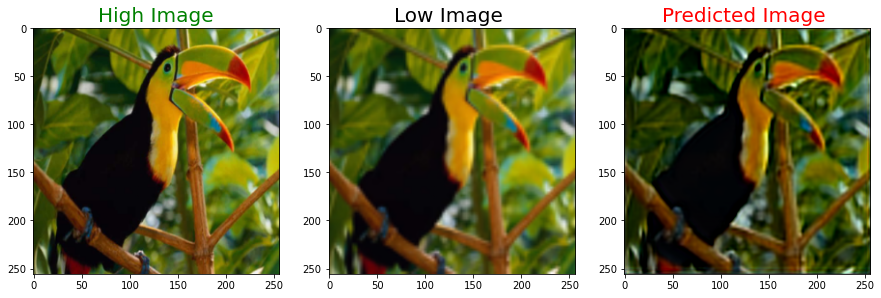

PSNR tf.Tensor(18.955114, shape=(), dtype=float32) dB SSIM tf.Tensor(0.67723984, shape=(), dtype=float32)


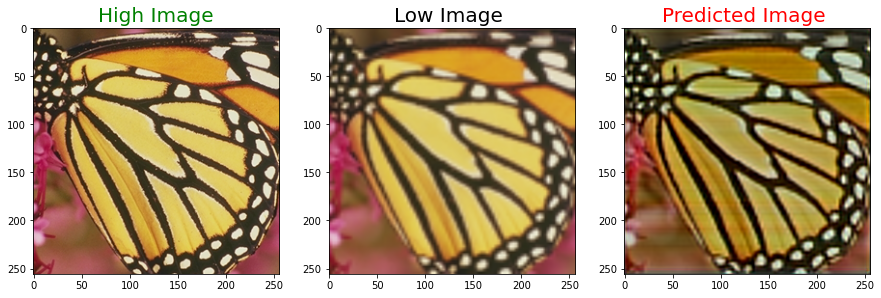

PSNR tf.Tensor(17.062546, shape=(), dtype=float32) dB SSIM tf.Tensor(0.6450027, shape=(), dtype=float32)


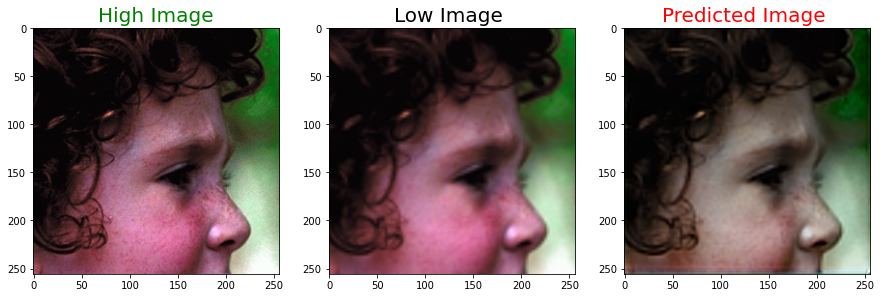

PSNR tf.Tensor(22.715923, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7721593, shape=(), dtype=float32)


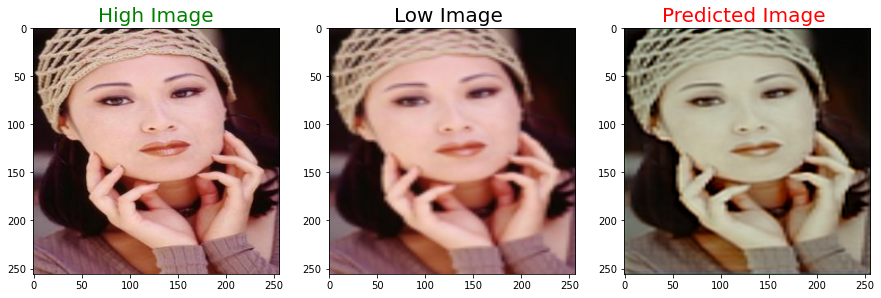

PSNR tf.Tensor(21.254786, shape=(), dtype=float32) dB SSIM tf.Tensor(0.83169705, shape=(), dtype=float32)


In [28]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(0,4):
    
    predicted = np.clip(model.predict(sett_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(sett_high_image[i],sett_low_image[i],predicted)
    print('PSNR',PSNR(sett_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(sett_high_image[i],predicted,max_val=1))